In [1]:
import matplotlib.pyplot as plt
from spider import SPIDER
op = SPIDER()
import anndata
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import os

2023-06-16 19:55:07.992597: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-06-16 19:55:07.994933: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-16 19:55:08.042533: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-16 19:55:08.044566: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-16 19:55:08.962811: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Co

In [2]:
import importlib
importlib.metadata.version('spider-st')

'0.1.19'

Using the results from SVI identification methods: ['SOMDE' 'SpatialDE' 'SPARKX' 'nnSVG' 'scGCO' 'gearyC' 'moranI']
46/47 SVIs identified (threshold=0.01).
evaluating with ['moranI' 'gearyC' 'SOMDE' 'nnSVG']
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Geary
C (rev.)_SVI vs. Geary
C (rev.)_Excluded: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.553e-01 U_stat=5.000e+00
Moran
I_SVI vs. Moran
I_Excluded: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.553e-01 U_stat=5.000e+00
FSV
(SOMDE)_SVI vs. FSV
(SOMDE)_Excluded: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.277e-01 U_stat=2.000e+00
LR
(SOMDE)_SVI vs. LR
(SOMDE)_Excluded: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.553e-01 U_stat=5.000e+00
LR
(nnSVG)_SVI vs. LR
(

100%|██████████| 1000/1000 [00:15<00:00, 65.84/s]


Mouse KEGG_2019_Mouse
Using mouse LR pair dataset.
50
0.49156920480343236 0.3017353078906976 0.23945333261991333
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1_yes vs. 1_no: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.850e-03 U_stat=9.000e+01
0_yes vs. 0_no: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.320e-06 U_stat=3.910e+02
2_yes vs. 2_no: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.850e-03 U_stat=9.000e+01
3_yes vs. 3_no: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.452e-08 U_stat=3.090e+02
4_yes vs. 4_no: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:4.255e-02 U_stat=4.600e+01
5_yes vs. 5_no: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:9

100%|██████████| 1000/1000 [00:09<00:00, 108.56/s]


Mouse KEGG_2019_Mouse
Using mouse LR pair dataset.
50
0.4989807999967013 0.31529319984863485 0.25538362026407235
p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

1_no vs. 1_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:7.292e-06 U_stat=1.900e+01
0_no vs. 0_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:8.196e-06 U_stat=7.000e+00
2_no vs. 2_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.676e-05 U_stat=9.000e+00
3_no vs. 3_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:1.863e-07 U_stat=0.000e+00
4_no vs. 4_yes: Mann-Whitney-Wilcoxon test two-sided with Benjamini-Hochberg correction, P_val:2.252e-08 U_stat=5.000e+00
Added key cell_pattern in idata.uns
Added key cell_score in idata.uns
Added key interaction_patt

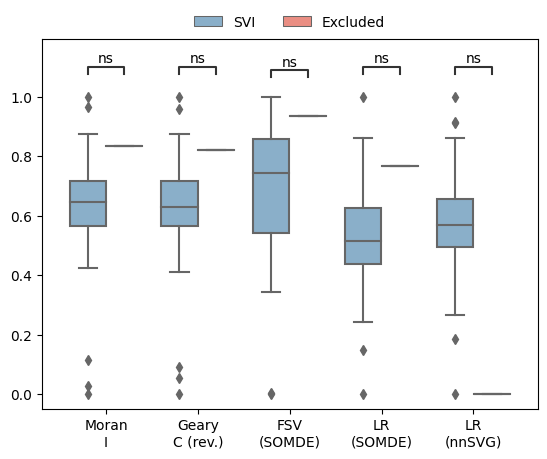

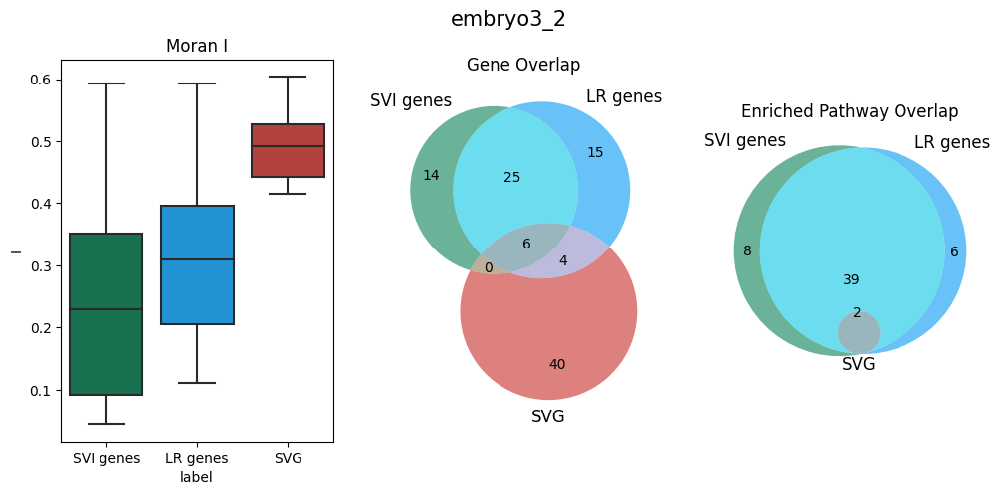

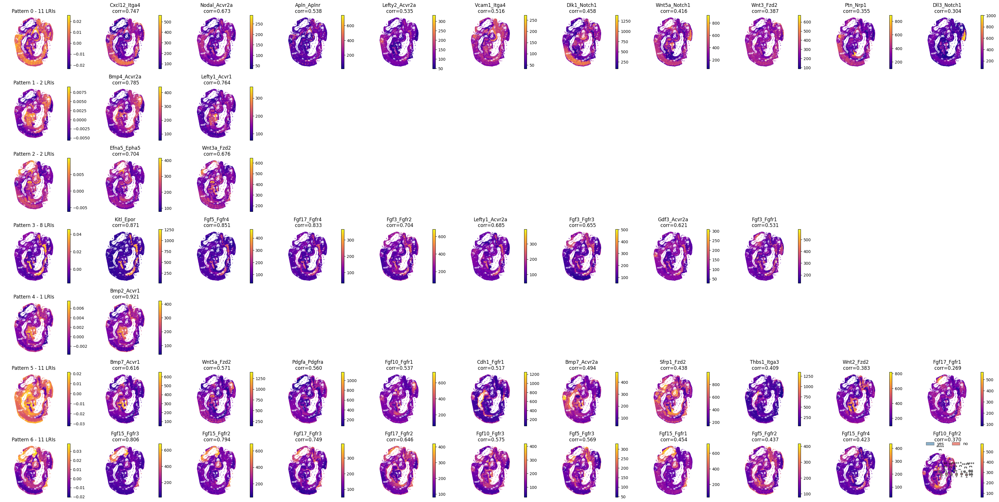

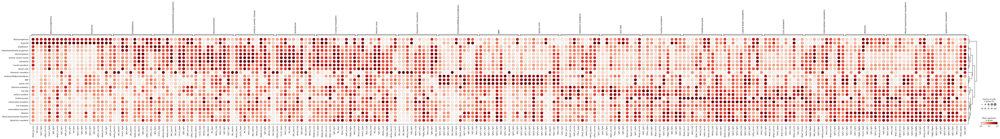

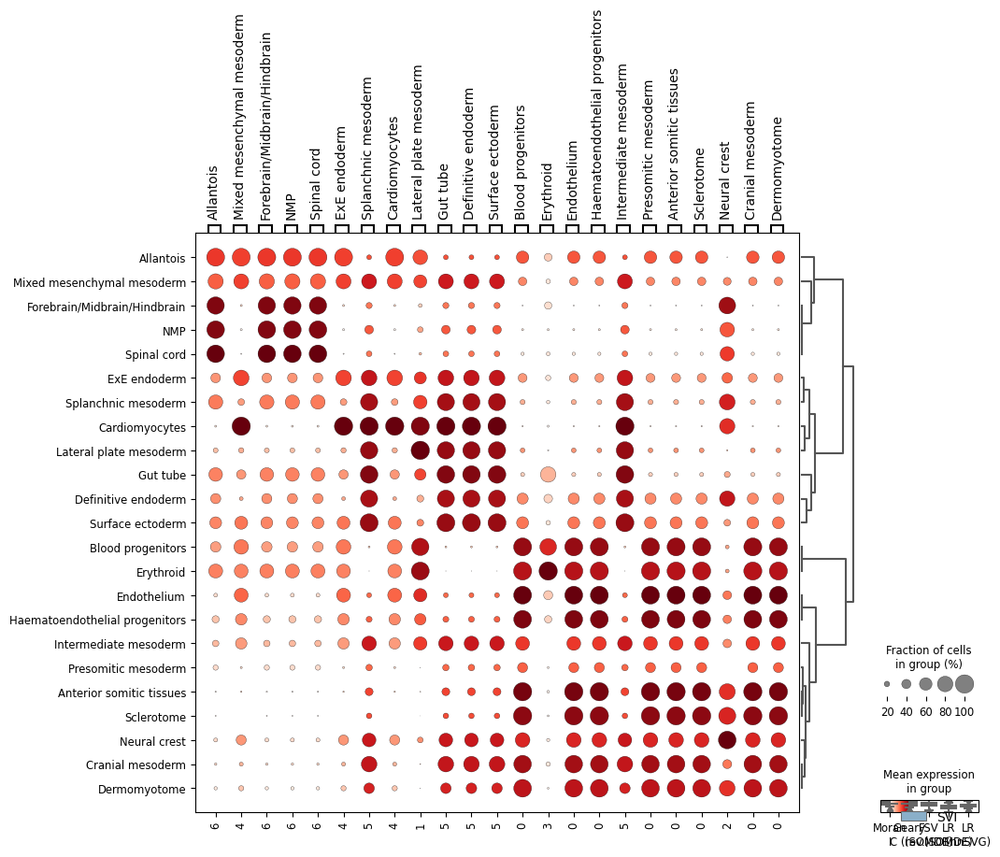

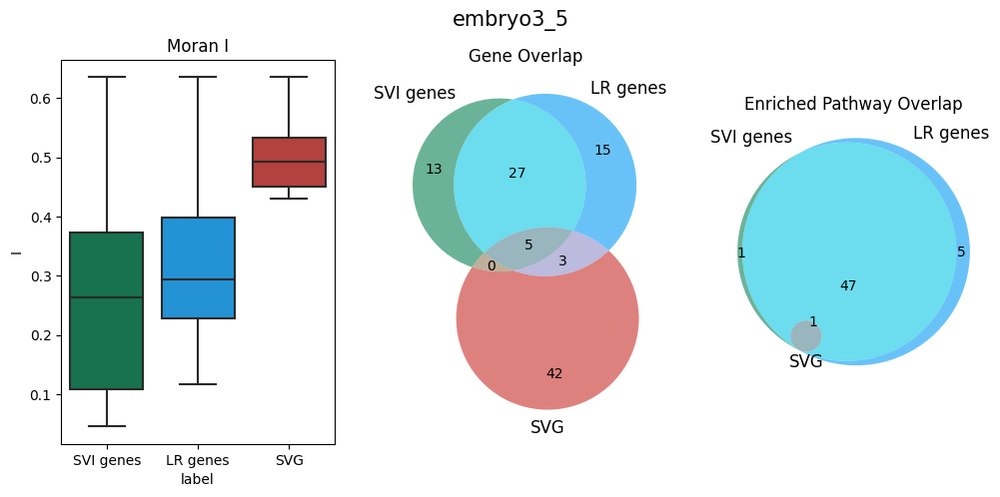

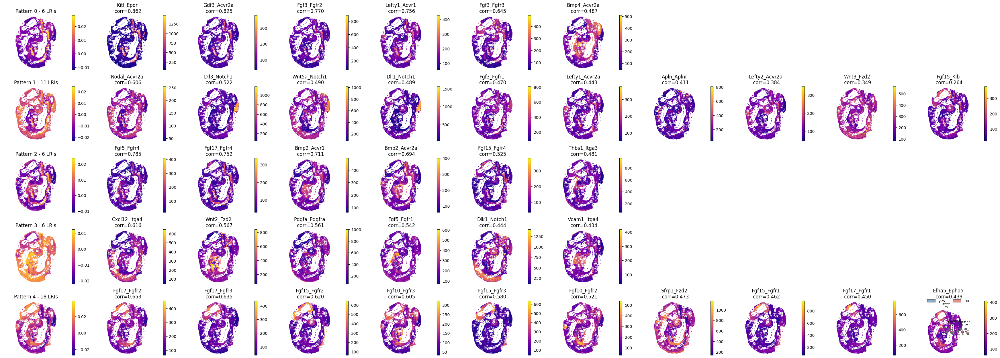

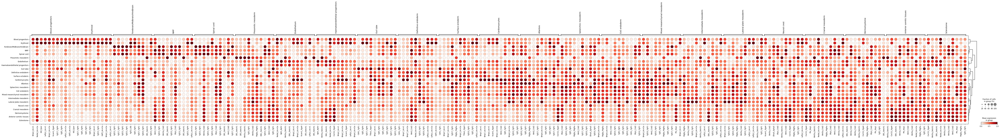

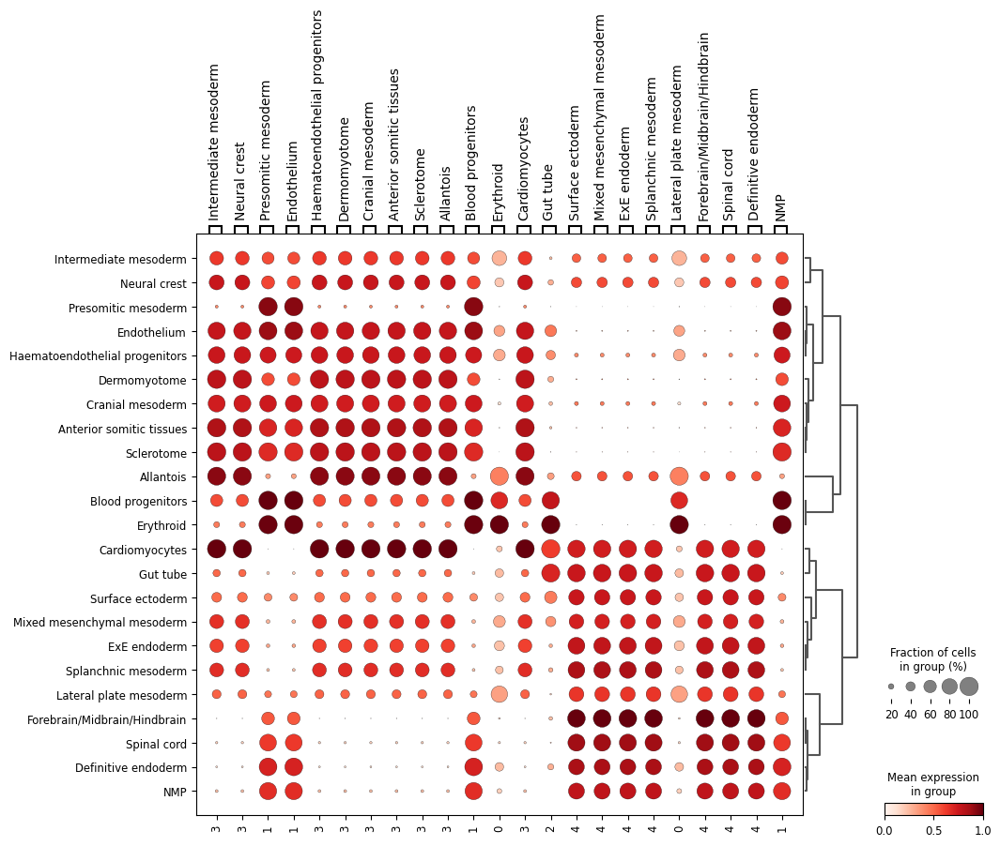

In [7]:
ds = 'mouse_embryo'
for sample_name in os.listdir(f'../datasets/{ds}/'):
    out_f = f'../datasets/{ds}/{sample_name}/'
    adata = anndata.read_h5ad(f'{out_f}/adata.h5ad')
    idata = anndata.read_h5ad(f'{out_f}/idata.h5ad')
    
    svi_df, svi_df_strict = op.svi.combine_SVI(idata,threshold=0.01)
    op.svi.eva_SVI(idata, svi_df_strict)
    plt.savefig(f'../figures/{ds}_{sample_name}_metric.png', dpi=300,bbox_inches='tight')
    
    op.util.adata_moranI(adata, out_f=out_f)
    merged_df,lri_pw_list,gene_lr_list,gene_pw_list = op.vis.svg_svi_relation(adata, idata, title=sample_name, is_human=adata.uns['is_human'], top=50)
    plt.savefig(f'../figures/{ds}_{sample_name}_relation.png', dpi=600,bbox_inches='tight')
    
    import gseapy
    membership=pd.get_dummies(merged_df.set_index('Term')['group']).groupby('Term').sum().astype(str).agg('-'.join, axis=1).reset_index()
    for x in membership[0].unique():
        sub_df = merged_df[merged_df.Term.isin(membership[membership[0]==x].Term)]
        if len(sub_df.Term.unique())>20:
            ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=20, figsize=(3,8),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}.png')
        elif len(sub_df.Term.unique())>10:
            ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=20, figsize=(3,6),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}.png')
        elif len(sub_df.Term.unique())<5:
            ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=30, figsize=(3,8),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}_large.png')
            ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=100, figsize=(3,1),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}_small.png')
        else:
            ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=10, figsize=(3,8),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}_large.png')
            ax = gseapy.dotplot(sub_df, title='',cmap='viridis_r', size=50, figsize=(3,2),top_term=30,show_ring=True, ofname=f'../figures/{ds}_{sample_name}_svgi_pw_{x}_small.png')
            
    op.vis.pattern_LRI(idata,show_SVI=10, spot_size=1)
    plt.tight_layout()
    plt.savefig(f'../figures/{ds}_{sample_name}_patterns.png', dpi=600,bbox_inches='tight')
    
    op.svi.eva_pattern(idata)
    plt.savefig(f'../figures/{ds}_{sample_name}_pattern_metric.png', dpi=600,bbox_inches='tight')
    
    idata = idata[:, idata.var['is_svi']==1]
    adata, adata_lri, adata_pattern = op.cell_transform(idata, adata, label=adata.uns['cluster_key'])
    
    with plt.rc_context():
        sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', show=False)
        plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI.png', bbox_inches="tight")
        
    with plt.rc_context():
        sc.pl.rank_genes_groups_dotplot(adata_lri, standard_scale='var', n_genes=1, show=False)
        plt.savefig(f'../figures/{ds}_{sample_name}_label_SVI1.png', bbox_inches="tight")
        
    with plt.rc_context(): 
        sc.pl.rank_genes_groups_dotplot(adata_pattern, standard_scale='var', n_genes=1, show=False)
        plt.savefig(f'../figures/{ds}_{sample_name}_label_pattern.png', bbox_inches="tight")
        
    from scipy import stats
    pds = []
    for i in adata_lri.var_names:
        pds.append(pd.get_dummies(adata.obs[adata.uns['cluster_key']]).corrwith(adata_lri.to_df()[i].astype('float'), method=stats.pointbiserialr)[:1])
    pds_df = pd.concat(pds)
    pds_df.index = adata_lri.var_names
    useful_df = []

    df_plot = pd.concat([idata.uns['cell_meta'][['x_global_affine', 'y_global_affine']], pd.get_dummies(idata.uns['cell_meta']['celltype_mapped_refined'])], axis=1)
    for i in adata.obs['celltype_mapped_refined'].unique():
        df_sub = pds_df[pds_df[i]>0.5][i].sort_values(ascending=False)
        if len(df_sub) > 0:
            useful_df.append(df_sub)
            markers = df_sub.index.to_numpy()
            corrs = df_sub.values
            cluster_name = df_sub.name
            plt.figure(figsize=(4*(len(markers)+1), 4))
            base = 1
            plt.subplot(1, len(markers)+1, base)

            plt.scatter(df_plot['x_global_affine'],df_plot['y_global_affine'], c=df_plot[cluster_name], s=0.5, cmap='plasma')
            plt.axis('equal')
            plt.axis('off')
            plt.title(f'{cluster_name}\n({sample_name})')
            base += 1

            marker_score = adata_lri.to_df()[markers]
            marker_score = pd.concat([adata.obs[['x_global_affine', 'y_global_affine']], marker_score], axis=1)
            for i in range(len(markers)):
                plt.subplot(1, len(markers)+1, base)
                im=plt.scatter(marker_score['x_global_affine'],marker_score['y_global_affine'], c=marker_score[markers[i]], s=0.5, cmap='plasma')
                plt.colorbar(im,fraction=0.046, pad=0.04)
                plt.axis('equal')
                plt.axis('off')
                plt.title(f'{markers[i]}\ncorr={"%.3f" % corrs[i]}')
                base += 1
            plt.savefig(f'../figures/{ds}_{sample_name}_{cluster_name.replace("/", "-")}.png', bbox_inches="tight", dpi=300)
            plt.close()
